In [1]:
#### This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/my-imgs/WIN_20250228_15_38_03_Pro.jpg
/kaggle/input/my-imgs/WIN_20250226_22_03_23_Pro.jpg
/kaggle/input/my-imgs/WIN_20230601_11_19_09_Pro.jpg
/kaggle/input/my-imgs/WIN_20250302_11_22_58_Pro.jpg
/kaggle/input/my-imgs/WIN_20241026_15_30_26_Pro.jpg


In [2]:
!pip install pytorch-lightning==1.2.2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 816.5/816.5 kB 21.1 MB/s eta 0:00:00
  Attempting uninstall: pytorch-lightning
    Found existing installation: pytorch-lightning 2.5.0.post0
    Uninstalling pytorch-lightning-2.5.0.post0:
      Successfully uninstalled pytorch-lightning-2.5.0.post0


In [3]:
#@markdown <h3> 📥 prepare and setup environment</h3>
# !pip install torch==1.7.1+cu110 torchvision==0.8.2+cu110 torchaudio==0.7.2  pytorch-lightning==1.2.2  torchtext==0.8.0 -f https://download.pytorch.org/whl/torch_stable.html

!pip install scipy
!pip install numpy
!pip install tqdm
!pip install pytorch-fid==0.2.0
!pip install pandas
!pip install lpips==0.1.4
!pip install lmdb==1.2.1
!pip install ftfy
!pip install regex
!pip install dlib requests




  Preparing metadata (setup.py) ... done
  Created wheel for pytorch-fid: filename=pytorch_fid-0.2.0-py3-none-any.whl size=10524 sha256=f69c7c97f804aeda467f4f52fd99140ce31f1b9a36426e01156e0557a6f84bc3
  Stored in directory: /root/.cache/pip/wheels/3b/71/5b/541560613ec27b54ce8aa2bd34a1d8415a90e78ac0c1732103
Successfully built pytorch-fid
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.5/881.5 kB 16.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lmdb: filename=lmdb-1.2.1-cp310-cp310-linux_x86_64.whl size=265653 sha256=a8c08cbb5475b94535a22586ac589e3c907131ae7e59dea85d5cd2433e802db0
  Stored in directory: /root/.cache/pip/wheels/ae/36/fc/13e586283759d30c3efc3d0b917b2c5f1b69d171de8b7ed204
Successfully built lmdb
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.2 MB/s eta 0:00:00


In [4]:
!git clone https://github.com/asu2304/diffae
%cd 'diffae'

Cloning into 'diffae'...
remote: Enumerating objects: 493, done.
remote: Counting objects: 100% (113/113), done.
remote: Compressing objects: 100% (36/36), done.
remote: Total 493 (delta 87), reused 77 (delta 77), pack-reused 380 (from 3)
Receiving objects: 100% (493/493), 11.24 MiB | 22.92 MiB/s, done.
Resolving deltas: 100% (279/279), done.
/kaggle/working/diffae


In [5]:
!ls    

align.py			   manipulate.ipynb
autoencoding.ipynb		   manipulate_note.ipynb
choices.py			   metrics.py
cog.yaml			   model
config_base.py			   predict.py
config.py			   README.md
data_resize_bedroom.py		   README.md.backup
data_resize_celebahq.py		   renderer.py
data_resize_celeba.py		   requirement_for_colab.txt
data_resize_ffhq.py		   requirements.txt
data_resize_horse.py		   run_bedroom128_ddim.py
dataset.py			   run_bedroom128.py
datasets			   run_celeba64.py
dataset_util.py			   run_ffhq128_cls.py
diffusion			   run_ffhq128_ddim.py
dist_utils.py			   run_ffhq128.py
evals				   run_ffhq256_cls.py
experiment_classifier.py	   run_ffhq256_latent.py
experiment.py			   run_ffhq256.py
imgs				   run_ffhq256.sh
imgs_align			   run_horse128_ddim.py
imgs_interpolate		   run_horse128.py
imgs_manipulated		   sample.ipynb
install_requirements_for_colab.sh  ssim.py
interpolate.ipynb		   templates_cls.py
LICENSE				   templates_latent.py
lmdb_writer.py			   templates.py


In [6]:
# # @markdown <h3> 🔧 Import libraries and tools </h3>

import os
import os.path as osp
import matplotlib.pyplot as plt

from templates import *
from templates_cls import *
from experiment_classifier import ClsModel

# defined a function to show the images 
def show_images(images, cols = 1, titles = None, apply_convert=False):
    if apply_convert: images = [convert(img) for img in images]
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
        a = fig.add_subplot(cols, int(np.ceil(n_images/float(cols))), n + 1)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images*2)
    plt.show()


# converting to RGB
def convert2rgb(img,adjust_scale=True):
    convert_img = img.clone().detach()
    if adjust_scale: convert_img = (convert_img+1)/2
    return (convert_img).permute(1, 2, 0).cpu()

In [7]:
!ls *.py

align.py		 dist_utils.py		   run_ffhq128_ddim.py
choices.py		 experiment_classifier.py  run_ffhq128.py
config_base.py		 experiment.py		   run_ffhq256_cls.py
config.py		 lmdb_writer.py		   run_ffhq256_latent.py
data_resize_bedroom.py	 metrics.py		   run_ffhq256.py
data_resize_celebahq.py  predict.py		   run_horse128_ddim.py
data_resize_celeba.py	 renderer.py		   run_horse128.py
data_resize_ffhq.py	 run_bedroom128_ddim.py    ssim.py
data_resize_horse.py	 run_bedroom128.py	   templates_cls.py
dataset.py		 run_celeba64.py	   templates_latent.py
dataset_util.py		 run_ffhq128_cls.py	   templates.py


In [8]:

device = 'cuda:0'
model_resolution = 256 #@param [128, 256]
T_inv = "100" #@param [50,100,125,200,250,500]
T_step = "50" #@param [50,100,125,200,250,500]

model_config = ffhq256_autoenc() if model_resolution == 256 else  ffhq128_autoenc_130M()

print(model_config.name)


# download model weight & its inferenced latents

ffhq256_autoenc


In [9]:
#@markdown <h3> 📥  Download pretrained weights </h3>


# model_config = ffhq256_autoenc() if model_resolution == 256 else  ffhq128_autoenc_130M()

# print(model_config.name)


download_paths = {
    256: {
        'diffae_weight': 'https://vistec-my.sharepoint.com/:u:/g/personal/nattanatc_pro_vistec_ac_th/ER56kn-uzlNAi39E1c784qQBkj5RI7-OAZC9QghQsIDQiQ?download=1' ,
        'diffae_latent':  'https://vistec-my.sharepoint.com/:u:/g/personal/nattanatc_pro_vistec_ac_th/EcZqHAWy2v9GuaXuESDg1tUB4li-hf0aC-2SjeLxB3ASdQ?download=1' ,
        'cls_weight': 'https://vistec-my.sharepoint.com/:u:/g/personal/nattanatc_pro_vistec_ac_th/ESzwEubKDNBEmYcbEr9O2jABtNqk_p7f2xYQ_t3PurXnHg?download=1'
    },
    128: {
        'diffae_weight': 'https://vistec-my.sharepoint.com/:u:/g/personal/nattanatc_pro_vistec_ac_th/Eb36o-4NlSFGmpj3Vut2p-gBswf8PsUmeiqIEbA8XmAqWA?download=1',
        'diffae_latent': 'https://vistec-my.sharepoint.com/:u:/g/personal/nattanatc_pro_vistec_ac_th/EQ9jjIjJRcJCs6h3d_LnJYoBvKk7zEMlHZn5btEKBEYoXg?download=1',
        'cls_weight': 'https://vistec-my.sharepoint.com/:u:/g/personal/nattanatc_pro_vistec_ac_th/Eb36o-4NlSFGmpj3Vut2p-gBswf8PsUmeiqIEbA8XmAqWA?download=1'
    }
}

weight_dir_path = f'checkpoints/{model_config.name}'
if not osp.exists(weight_dir_path): os.makedirs(weight_dir_path)
model_download_path = download_paths[model_resolution]['diffae_weight']
latents_download_path = download_paths[model_resolution]['diffae_latent']
!wget -O '{weight_dir_path}/last.ckpt' '{model_download_path}'
!wget -O '{weight_dir_path}/latent.pkl' '{latents_download_path}'



classifer_config = ffhq256_autoenc_cls() if model_resolution == 256 else ffhq128_autoenc_130M()
weight_dir_path = f'checkpoints/{classifer_config.name}'
if not osp.exists(weight_dir_path): os.makedirs(weight_dir_path)
cls_download_path = download_paths[model_resolution]['cls_weight']
!wget -O '{weight_dir_path}/last.ckpt' '{cls_download_path}'

--2025-03-23 17:48:30--  https://vistec-my.sharepoint.com/:u:/g/personal/nattanatc_pro_vistec_ac_th/ER56kn-uzlNAi39E1c784qQBkj5RI7-OAZC9QghQsIDQiQ?download=1
Resolving vistec-my.sharepoint.com (vistec-my.sharepoint.com)... 13.107.138.10, 13.107.136.10, 2620:1ec:8fa::10, ...
Connecting to vistec-my.sharepoint.com (vistec-my.sharepoint.com)|13.107.138.10|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /personal/nattanatc_pro_vistec_ac_th/Documents/diffae-public/checkpoints/ffhq256_autoenc/last.ckpt?ga=1 [following]
--2025-03-23 17:48:31--  https://vistec-my.sharepoint.com/personal/nattanatc_pro_vistec_ac_th/Documents/diffae-public/checkpoints/ffhq256_autoenc/last.ckpt?ga=1
Reusing existing connection to vistec-my.sharepoint.com:443.
HTTP request sent, awaiting response... 200 OK
Length: 2722085968 (2.5G) [application/octet-stream]
Saving to: ‘checkpoints/ffhq256_autoenc/last.ckpt’

checkpoints/ffhq256 100%[===================>]   2.53G  55.9MB/s    in 53s  

In [10]:
##@markdown <h3> ⚡ Model Initialization </h3>

import torch
from pytorch_lightning.callbacks.model_checkpoint import ModelCheckpoint

# Add ModelCheckpoint to safe globals
torch.serialization.add_safe_globals([ModelCheckpoint])

model = LitModel(model_config)
# Load the state with weights_only=False
state = torch.load(f'checkpoints/{model_config.name}/last.ckpt', map_location='cpu')
model.load_state_dict(state['state_dict'], strict=False)
model.ema_model.eval()
model.ema_model.to(device);

Global seed set to 0


Model params: 160.69 M


<ipython-input-10-8c2165c16eaa>:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(f'checkpoints/{model_config.name}/last.ckpt', map_location='cpu')


In [11]:
#@markdown <h3>  🐶 😸  Classifier Initialization  </h3>

classifier_config = ffhq256_autoenc_cls() if model_resolution == 256 else ffhq128_autoenc_cls()
classifier_config.pretrain = None # a bit faster
classifier_config.pretrain = None # a bit faster
classifier = ClsModel(classifier_config)
state = torch.load(f'checkpoints/{classifer_config.name}/last.ckpt', map_location='cpu')
print('latent step:', state['global_step'])
classifier.load_state_dict(state['state_dict'], strict=False)
classifier.to(device);


Global seed set to 0


loading latent stats ...


/kaggle/working/diffae/experiment_classifier.py:57: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(conf.latent_infer_path)
<ipython-input-11-2d4470c61dae>:

latent step: 9375


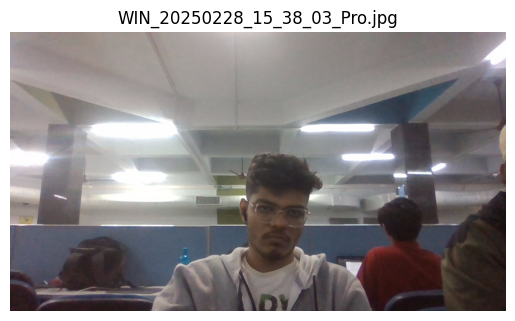

Copied WIN_20250228_15_38_03_Pro.jpg to imgs


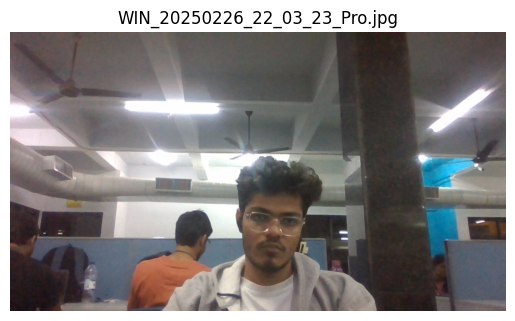

Copied WIN_20250226_22_03_23_Pro.jpg to imgs


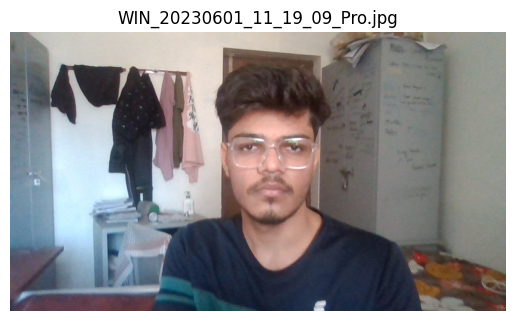

Copied WIN_20230601_11_19_09_Pro.jpg to imgs


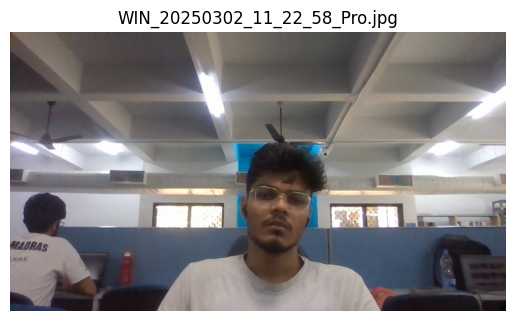

Copied WIN_20250302_11_22_58_Pro.jpg to imgs


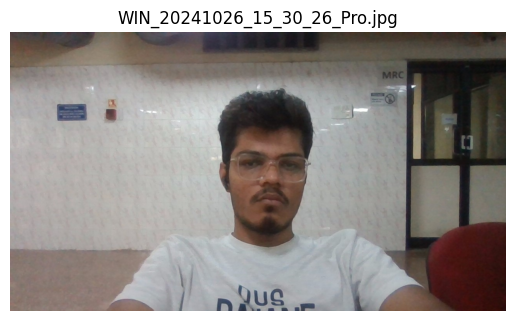

Copied WIN_20241026_15_30_26_Pro.jpg to imgs


In [12]:
import cv2
import os
import glob
import shutil
import matplotlib.pyplot as plt

# Define dataset path (Replace 'your-dataset-folder' with the actual folder name)
dataset_path = "/kaggle/input/my-imgs/"
output_folder = "imgs"

# Create output directory if not exists
if not os.path.exists(output_folder):
    os.makedirs(output_folder)
    
# Get all image files (JPG, PNG, etc.) from dataset folder
image_files = glob.glob(os.path.join(dataset_path, "*"))

def load_and_display_images():

    for img_path in image_files:
        img_name = os.path.basename(img_path)  # Extract filename
        img = cv2.imread(img_path)  # Read image using OpenCV
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for correct display

        # Display the image using Matplotlib (since cv2_imshow is for Colab)
        plt.imshow(img)
        plt.axis('off')
        plt.title(img_name)
        plt.show()

        # Move image to 'imgs' folder
        shutil.copy(img_path, os.path.join(output_folder, img_name))
        print(f"Copied {img_name} to {output_folder}")

# Run the function
load_and_display_images()


In [13]:
!pip install dlib requests

In [14]:
!pip install "pillow<10"
!python align.py

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 52.9 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: pillow 11.0.0
    Uninstalling pillow-11.0.0:
      Successfully uninstalled pillow-11.0.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-genai 0.2.2 requires pillow<12.0.0,>=10.0.0, but you have pillow 9.5.0 which is incompatible.
mlxtend 0.23.3 requires scikit-learn>=1.3.1, but you have scikit-learn 1.2.2 which is incompatible.
plotnine 0.14.4 requires matplotlib>=3.8.0, but you have matplotlib 3.7.5 which is incompatible.
scikit-image 0.25.0 requires pillow>=10.1, but you have pillow 9.5.0 which is incompatible.
total img files 6
  0%|                                                     | 0/6 [00:00<?, ?it/s]/kaggle/working/diffae/align.py:117: DeprecationWarning: ANTIALIAS is deprecated and will be removed in P

In [15]:
!ls imgs/

sandy.JPG		       WIN_20250226_22_03_23_Pro.jpg
WIN_20230601_11_19_09_Pro.jpg  WIN_20250228_15_38_03_Pro.jpg
WIN_20241026_15_30_26_Pro.jpg  WIN_20250302_11_22_58_Pro.jpg


In [16]:
!rm -rf imgs/sandy.JPG

Found 5 input images: ['WIN_20230601_11_19_09_Pro.jpg', 'WIN_20241026_15_30_26_Pro.jpg', 'WIN_20250226_22_03_23_Pro.jpg', 'WIN_20250228_15_38_03_Pro.jpg', 'WIN_20250302_11_22_58_Pro.jpg']
cached
cached
total img files 5
  0%|          | 0/5 [00:00<?, ?it/s]/kaggle/working/diffae/align.py:117: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((output_size, output_size), PIL.Image.ANTIALIAS)
 80%|████████  | 4/5 [00:07<00:01,  1.83s/it]
output aligned images at: aligned_uploaded_imgs
Found 4 aligned images: ['WIN_20230601_11_19_09_Pro.png', 'WIN_20241026_15_30_26_Pro.png', 'WIN_20250226_22_03_23_Pro.png', 'WIN_20250302_11_22_58_Pro.png']


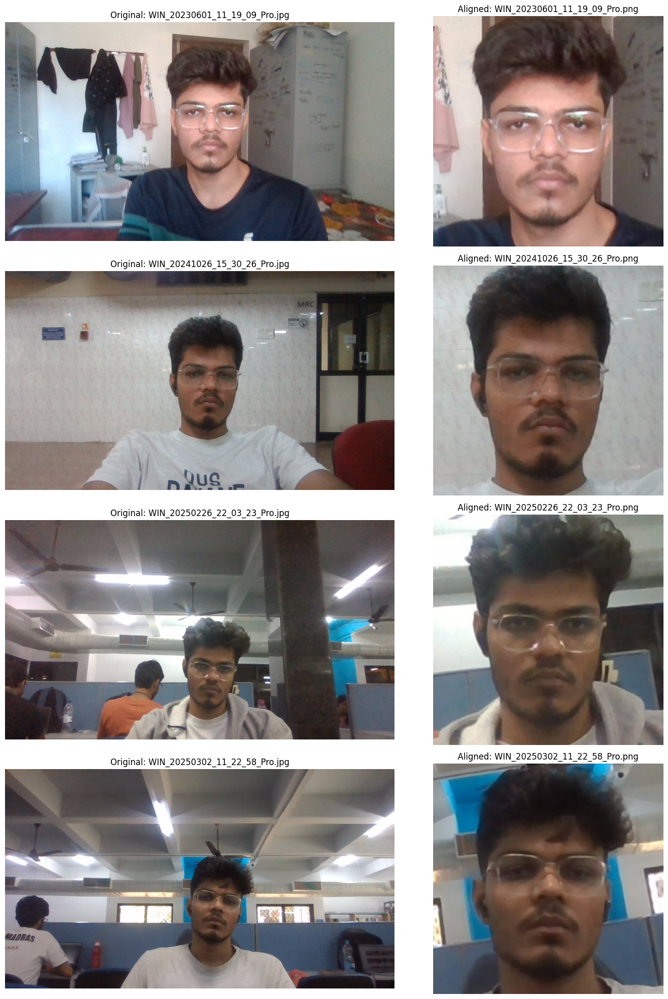

In [17]:
import os
import os.path as osp
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline

uploaded_imgs_path = 'imgs'
aligned_uploaded_imgs_path = 'aligned_uploaded_imgs'

# Get sorted list of original image files
input_files = sorted([
    f for f in os.listdir(uploaded_imgs_path)
    if osp.isfile(osp.join(uploaded_imgs_path, f)) and
    f.lower().endswith(('jpg', 'jpeg', 'png', 'gif', 'bmp')) and
    not f.startswith('.')  # Exclude hidden files
])
print(f"Found {len(input_files)} input images:", input_files)

# Run alignment script
!python align.py -i '{uploaded_imgs_path}' -o '{aligned_uploaded_imgs_path}' 2>&1 | tee alignment.log

# Get sorted list of aligned images
aligned_files = sorted([
    f for f in os.listdir(aligned_uploaded_imgs_path)
    if osp.isfile(osp.join(aligned_uploaded_imgs_path, f)) and
    f.lower().endswith(('jpg', 'jpeg', 'png', 'gif', 'bmp'))
])
print(f"Found {len(aligned_files)} aligned images:", aligned_files)

# Ensure synchronization by matching filenames (ignoring extensions)
original_basenames = {osp.splitext(f)[0]: f for f in input_files}
aligned_basenames = {osp.splitext(f)[0]: f for f in aligned_files}

if len(aligned_files) > 0:
    data = ImageDataset(
        aligned_uploaded_imgs_path,
        image_size=model_config.img_size,
        exts=['jpg','jpeg','JPG','png'],
        do_augment=False
    )
    
# Find common keys to ensure correct pairing
common_keys = sorted(set(original_basenames.keys()) & set(aligned_basenames.keys()))
if not common_keys:
    print("No matching aligned images found! Check alignment.log for errors")
    exit()

# Display side-by-side comparison
num_images = min(len(common_keys), 5)
plt.figure(figsize=(15, 5*num_images))

for i, key in enumerate(common_keys[:num_images]):
    # Load original and aligned images
    original_path = osp.join(uploaded_imgs_path, original_basenames[key])
    aligned_path = osp.join(aligned_uploaded_imgs_path, aligned_basenames[key])

    original_img = Image.open(original_path).convert('RGB')
    aligned_img = Image.open(aligned_path).convert('RGB')  # Directly open instead of using dataset loader

    # Plot original
    plt.subplot(num_images, 2, 2*i+1)
    plt.imshow(original_img)
    plt.title(f'Original: {original_basenames[key]}')
    plt.axis('off')

    # Plot aligned
    plt.subplot(num_images, 2, 2*i+2)
    plt.imshow(aligned_img)
    plt.title(f'Aligned: {aligned_basenames[key]}')
    plt.axis('off')

plt.tight_layout()
plt.show()


In [18]:
#@markdown <h3>  👶  🔁  👨 🔁  👴  Encode and Manipulate the uploaded image </h3>
#@markdown <h5> manipulation amplitude: The Strongness of Manipulation <h5/>.
# too strong would be resulted in artifact as it could dominate the original image information </small>


# select a target class form the following list
target_class = ['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 
                'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 
                'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 
                'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 
                'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 
                'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 
                'Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 
                'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 
                'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 
                'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 
                'Wearing_Necktie', 'Young']

target_class = 'Smiling' 
manipulation_amplitude = 0.20 # change the manipulation of the strongness from here

# reverse the amplitude for some classes that are trained with opposite labels
cls_manipulation_amplitude = manipulation_amplitude
interpreted_target_class = target_class
if target_class not in CelebAttrDataset.id_to_cls and f'No_{target_class}' in CelebAttrDataset.id_to_cls:
  cls_manipulation_amplitude = -manipulation_amplitude
  interpreted_target_class = f'No_{target_class}'



batch = data[1]['img'][None]

semantic_latent = model.encode(batch.to(device))
stochastic_latent = model.encode_stochastic(batch.to(device), semantic_latent, T=T_inv)




cls_id = CelebAttrDataset.cls_to_id[interpreted_target_class]
class_direction = classifier.classifier.weight[cls_id]
normalized_class_direction = F.normalize(class_direction[None, :], dim=1)

normalized_semantic_latent = classifier.normalize(semantic_latent)
normalized_manipulation_amp = cls_manipulation_amplitude * math.sqrt(512)
normalized_manipulated_semantic_latent =  normalized_semantic_latent + normalized_manipulation_amp*normalized_class_direction

manipulated_semantic_latent = classifier.denormalize(normalized_manipulated_semantic_latent)



/kaggle/working/diffae/diffusion/base.py:306: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(self.conf.fp16):


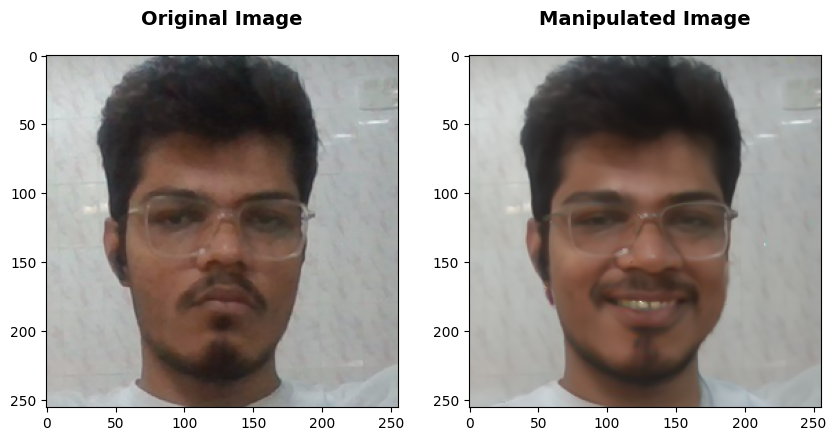

In [19]:

manipulated_img = model.render(stochastic_latent, manipulated_semantic_latent, T=T_step)[0]
original_img = data[1]['img']

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(convert2rgb(original_img))
ax[0].set_title('Original Image\n', fontsize=14, fontweight='bold')
ax[1].imshow(convert2rgb(manipulated_img,adjust_scale=False))
ax[1].set_title('Manipulated Image\n', fontsize=14, fontweight='bold')
plt.savefig(f'imgs_manipulated/compare_{target_class}.png')

In [20]:
!ls imgs_manipulated/

compare.png  compare_Smiling.png  output.png  sandy-wavyhair.png


In [21]:
!ls datasets/celeba_anno/

CelebAMask-HQ-attribute-anno.txt  list_attr_celeba.txt
CelebAMask-HQ-pose-anno.txt


In [22]:
!cp imgs/photo.jpg imgs_interpolate/

cp: cannot stat 'imgs/photo.jpg': No such file or directory


In [23]:
!ls imgs_interpolate/

1_a.png  1_b.png


In [24]:
%load_ext autoreload
%autoreload 2

In [25]:
device = 'cuda:0'
conf = ffhq256_autoenc()
# print(conf.name)
model = LitModel(conf)
state = torch.load(f'checkpoints/{conf.name}/last.ckpt', map_location='cpu',  weights_only=False)
model.load_state_dict(state['state_dict'], strict=False)
model.ema_model.eval()
model.ema_model.to(device);

Global seed set to 0


Model params: 160.69 M


#### data creation for interpolation

In [26]:
import shutil
import os

# Define source and destination directories within /kaggle/working
source_dir = "/kaggle/working/diffae/imgs_align"   # Change to actual source folder
destination_dir = "/kaggle/working/diffae/imgs_interpolate"  # Change to actual destination folder

# Create the destination folder if it doesn't exist
os.makedirs(destination_dir, exist_ok=True)

# List of images to move
images_to_move = ["WIN_20230601_11_19_09_Pro.png", "WIN_20241026_15_30_26_Pro.png"]  # Change to actual file names

# Move each image
for img in images_to_move:
    src_path = os.path.join(source_dir, img)
    dest_path = os.path.join(destination_dir, img)
    shutil.move(src_path, dest_path)

print("Images moved successfully!")


Images moved successfully!


In [27]:
data = ImageDataset('imgs_interpolate', image_size=conf.img_size, exts=['jpg', 'JPG', 'png', 'jpeg'], do_augment=False)
batch = torch.stack([
    data[2]['img'],
    data[3]['img'],
])

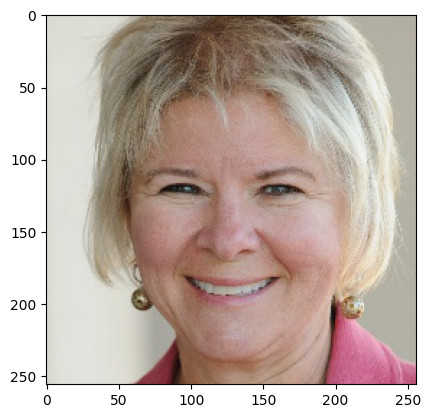

In [28]:
import matplotlib.pyplot as plt
plt.imshow(batch[1].permute([1, 2, 0]) / 2 + 0.5)

In [29]:
cond = model.encode(batch.to(device))
xT = model.encode_stochastic(batch.to(device), cond, T=250)

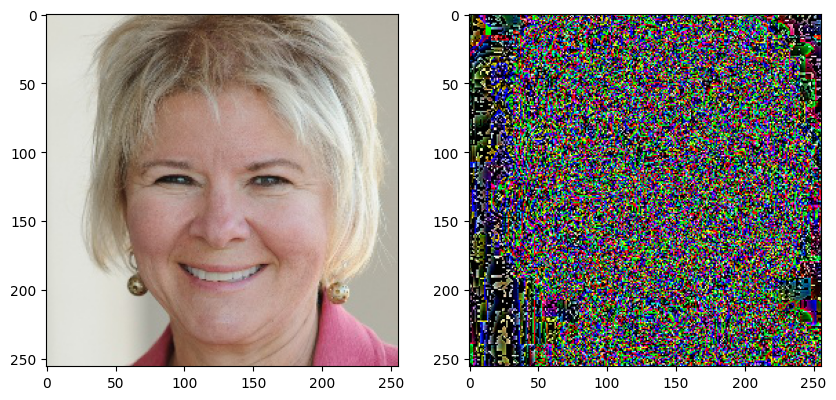

In [30]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ori = (batch + 1) / 2
ax[0].imshow(ori[1].permute(1, 2, 0).cpu())
ax[1].imshow(xT[1].permute(1, 2, 0).cpu())

# Interpolation between two images

In [31]:
import torch
import numpy as np
alpha = torch.tensor(np.linspace(0, 1, 10, dtype=np.float32)).to(cond.device)
intp = cond[0][None] * (1 - alpha[:, None]) + cond[1][None] * alpha[:, None]

def cos(a, b):
    a = a.view(-1)
    b = b.view(-1)
    a = F.normalize(a, dim=0)
    b = F.normalize(b, dim=0)
    return (a * b).sum()

theta = torch.arccos(cos(xT[0], xT[1]))
x_shape = xT[0].shape
intp_x = (torch.sin((1 - alpha[:, None]) * theta) * xT[0].flatten(0, 2)[None] + torch.sin(alpha[:, None] * theta) * xT[1].flatten(0, 2)[None]) / torch.sin(theta)
intp_x = intp_x.view(-1, *x_shape)

pred = model.render(intp_x, intp, T=100)

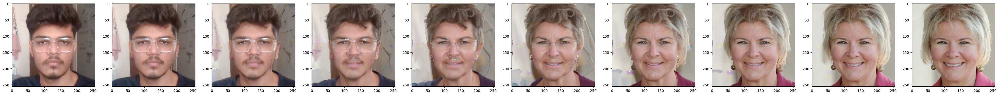

In [32]:
import matplotlib.pyplot as plt
# torch.manual_seed(1)
fig, ax = plt.subplots(1, 10, figsize=(5*10, 5))
for i in range(len(alpha)):
    ax[i].imshow(pred[i].permute(1, 2, 0).cpu())
plt.savefig('imgs_manipulated/compare.png')

# unconditional sampling

In [33]:
from templates_latent import *
conf = ffhq256_autoenc_latent()

In [34]:
conf = ffhq256_autoenc_latent()
sampler_download_path = "https://drive.usercontent.google.com/download?id=1-MXdiyQVPj6RjoGrrTLSiPbzSa0CDC0-&export=download&authuser=0&confirm=t&uuid=bba5e5ae-d861-4c3e-97c9-06a5fe034e29&at=AEz70l5YMdf7I7AmBz7YTat1yV5g:1742238686609"
weight_dir_path = f'checkpoints_sampler/{conf.name}'
if not osp.exists(weight_dir_path): os.makedirs(weight_dir_path)
!wget -O '{weight_dir_path}/last.ckpt' '{sampler_download_path}'

--2025-03-23 17:52:42--  https://drive.usercontent.google.com/download?id=1-MXdiyQVPj6RjoGrrTLSiPbzSa0CDC0-&export=download&authuser=0&confirm=t&uuid=bba5e5ae-d861-4c3e-97c9-06a5fe034e29&at=AEz70l5YMdf7I7AmBz7YTat1yV5g:1742238686609
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.197.132, 2607:f8b0:400e:c03::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.197.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2239597003 (2.1G) [application/octet-stream]
Saving to: ‘checkpoints_sampler/ffhq256_autoenc_latent/last.ckpt’

checkpoints_sampler 100%[===================>]   2.08G  96.8MB/s    in 20s     

2025-03-23 17:53:04 (109 MB/s) - ‘checkpoints_sampler/ffhq256_autoenc_latent/last.ckpt’ saved [2239597003/2239597003]



In [35]:
!ls checkpoints_sampler/ffhq256_autoenc_latent/

last.ckpt


In [36]:
device = 'cuda:0'
conf = ffhq256_autoenc_latent()
conf.T_eval = 100
conf.latent_T_eval = 100
print(conf.name)
model = LitModel(conf)
state = torch.load(f'checkpoints_sampler/{conf.name}/last.ckpt', map_location='cpu',  weights_only=False)
print(model.load_state_dict(state['state_dict'], strict=False))
model.to(device);

Global seed set to 0


ffhq256_autoenc_latent
Model params: 212.29 M
loading pretrain ... 90M


/kaggle/working/diffae/experiment.py:71: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(conf.pretrain.path, map_location='cpu')


step: 1563562
loading latent stats ...


/kaggle/working/diffae/experiment.py:77: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(conf.latent_infer_path)


<All keys matched successfully>


In [37]:
torch.manual_seed(6)
imgs = model.sample(8, device=device, T=20, T_latent=200)

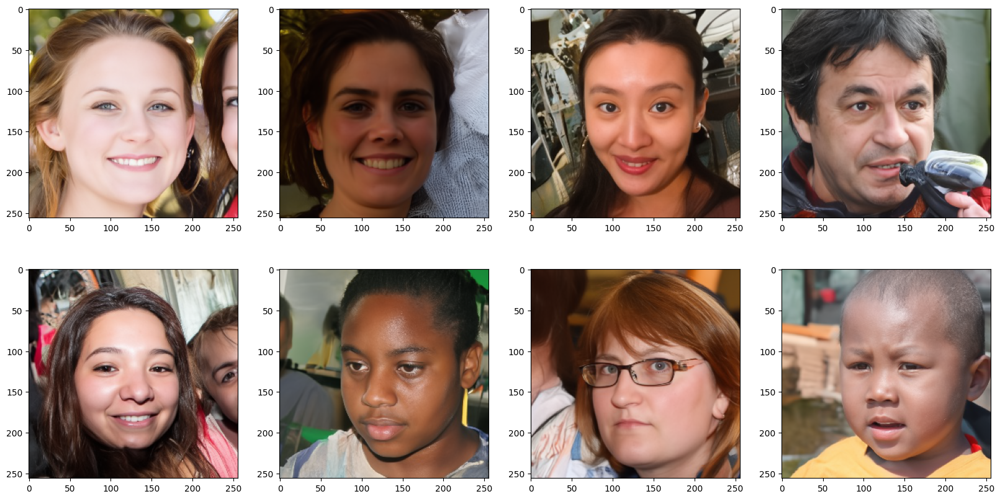

In [38]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(2, 4, figsize=(4*5, 2*5))
ax = ax.flatten()
for i in range(len(imgs)):
    ax[i].imshow(imgs[i].cpu().permute([1, 2, 0]))

<h4> If you find our paper or code useful in your research, please consider citing: </h4>


<pre><code> @inproceedings{preechakul2021diffusion,
      title={Diffusion Autoencoders: Toward a Meaningful and Decodable Representation},
      author={Preechakul, Konpat and Chatthee, Nattanat and Wizadwongsa, Suttisak and Suwajanakorn, Supasorn},
      booktitle={IEEE Conference on Computer Vision and Pattern Recognition (CVPR)},
      year={2022},
}  <code>